# Deep Learning with tSNE visualizations on MNIST Dataset

In this notebook, we will explore the t-distributed Stochastic Neighbor Embedding (tSNE) as a visualization tool for the MNIST dataset. tSNE is a powerful dimensionality reduction technique that focuses on local pairwise similarities between the input features. It has been shown to outperform other techniques, including PCA, ISOMAP, locally linear embedding, etc (see van der Maaten and Hinton, JMLR, 2008). So, it certainly warrants some exploration. As we will see shortly, the visualizations resulting from tSNE dimensionality reduction is ridiculously cool and is indeed insightful for understanding the structure of the data as well as the difficulty of the classification problem. 

tSNE works by minimizing the Kullback-Leibler divergence between two distributions, the distribution of distances between pairwise data points in the high-dimensional dataset $p_{i,j}$ and the distribution of the distances between pairwise datapoints in the low-dimensional data projection $q_{i,j}$. $p_{i,j}$ is given by a normal distribution and $q_{i,j}$ is given by the student's t-distribution. Importantly, this cost allows tSNE to preserve local similarity structure of the high dimensional data on the lower dimensional projection. 

For instance, when datapoints are near each other in the high-dimensional space, the normal distribution will yield a high probability. Similarly, a high probability in the t-distribution will keep these data points in close proximity in the low-dimensional projection.  Similarly, when data points are dissimilar in the high-dimensional data, then this yields a low probability given by the tail of the normal distribution. Since KL divergence wants to maintain the same probability level as in the high-dimensional space, the same probability level in the t-distribution corresponds to a further distance in the low-dimensional projection space, because of the t-distribution's fat tails. So, similar data points are clustered closely, while dissimilar points are pushed far away, thereby avoiding "the crowding problem", which is a common problem in dimensionality reduction.

In [1]:
from __future__ import print_function
import os, sys, gzip
import cPickle as pickle
sys.setrecursionlimit(10000)

import numpy as np
np.random.seed(1004)   # for reproducibility

# stochastic neighbor embedding (to install --> pip install tsne)
from tsne import bh_sne

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
%matplotlib inline
from scipy.misc import imresize

from lasagne import layers, nonlinearities, updates, objectives, init 
from lasagne.layers import get_output, get_output_shape, get_all_params
import theano.tensor as T
import theano

Using gpu device 0: GeForce GTX 980 (CNMeM is disabled, CuDNN 4007)


## Load the MNIST dataset 

Note, if you don't have the MNIST dataset, you can download it via:

!wget http://deeplearning.net/data/mnist/mnist.pkl.gz

In [3]:
# load mnist data
fname = '/home/peter/Data/mnist/mnist.pkl.gz'
f = gzip.open(fname, 'rb')
train_set, valid_set, test_set = pickle.load(f)
f.close()
X_train, y_train = train_set
X_valid, y_valid = valid_set
X_test, y_test = test_set

num_labels = 10
num_train = len(y_train)
num_valid = len(y_valid)
num_test = len(y_test)

## tSNE on MNIST pixels

Let's first directly run tSNE with the Barnes-Hut approximation directly on the pixels of the images from the MNIST dataset.

In [4]:
# perform t-SNE embedding
vis_pixel = bh_sne(X_train.astype(float))

Now, let's plot the results. Although tSNE is completely unsupervised, it is more informative if we give the projection coordinates a color based on the labels.  

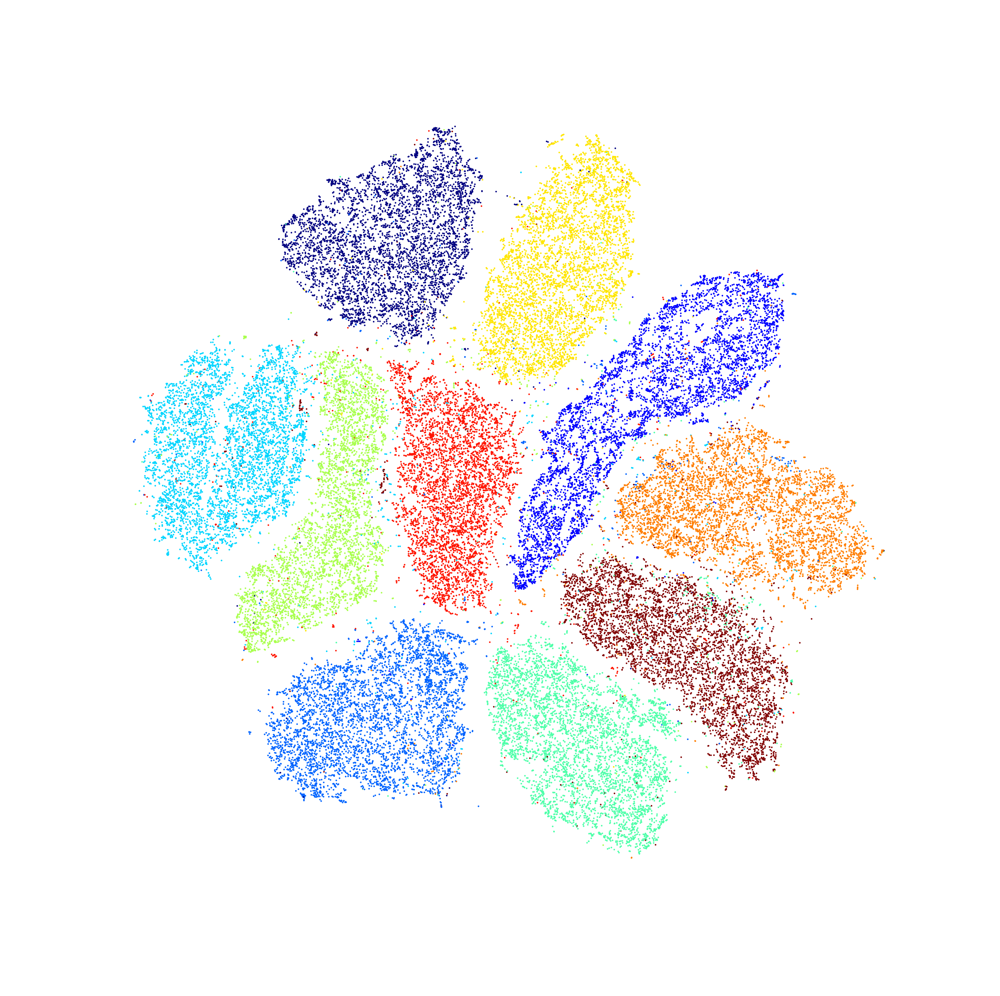

In [5]:
def tSNE_plot(vis_data, labels):
    """scatter plot of tSNE 2D projections, with a color corresponding to labels"""
    num_labels = max(labels)+1
    vis_x = vis_data[:,0]
    vis_y = vis_data[:,1]
    plt.figure(figsize = (10,10))
    fig = plt.gcf()
    fig.set_size_inches(50, 50, forward=True)
    plt.scatter(vis_x, vis_y, c=labels, cmap=plt.cm.get_cmap("jet", num_labels),  edgecolor = 'none')
    plt.axis('off')
    return plt

plt = tSNE_plot(vis_pixel, y_train)    
plt.savefig('MNIST_tSNE_pixel.eps', format='eps', dpi=1000)

This is a cool visualization of the data, but we don't know what the structure of the data look like within each class. Evidently, we can learn more about the structure of the data if we embed the acutal images onto each projection coordinate. 

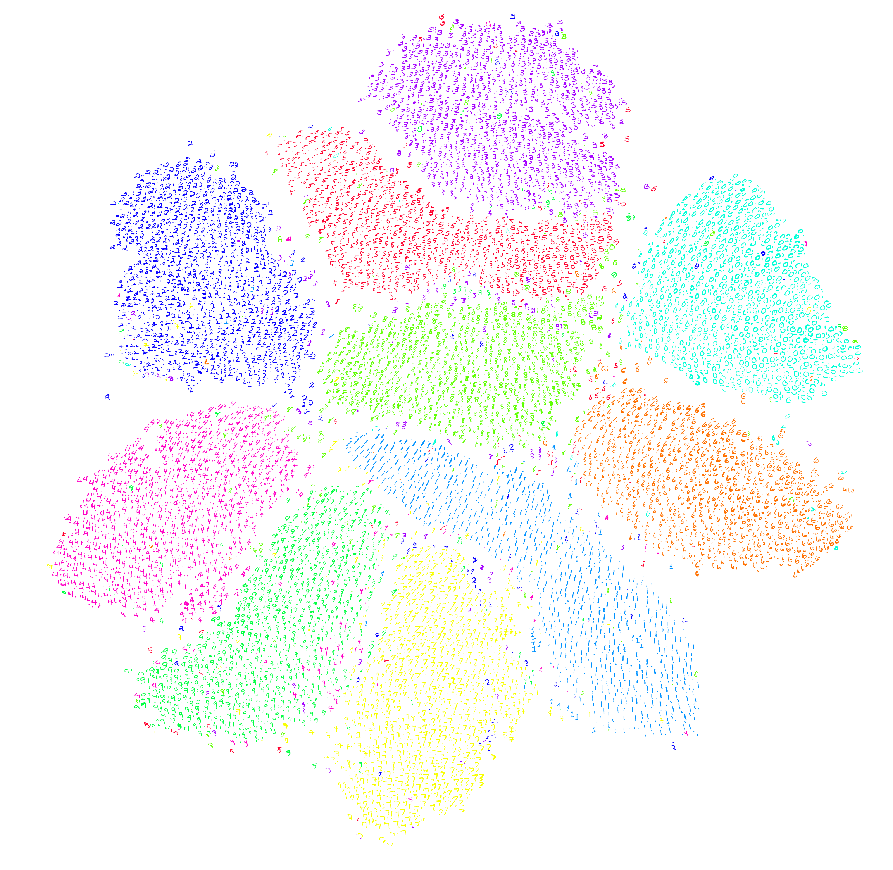

In [6]:
def tSNE_embed_plot(vis_data, X_train, y_train):
    """image embeded with original images at locations given by 
    2D tSNE projection coordinates """

    num_labels = max(y_train)+1
    
    # setup a colormap
    colormap = cm.gist_rainbow(np.linspace(0, 255, num_labels).astype(int))

    # rescale embedding coordinates within [0, 1]
    vis_data -= np.min(vis_data)
    vis_data /= np.max(vis_data)

    # create canvas to embed images
    canvas_size = 3000
    canvas = np.zeros((canvas_size, canvas_size, 3)).astype(np.uint8)

    # set image_size, will downsample if smaller than 28
    image_size = 28
    scale = canvas_size-image_size

    # embed images onto canvas
    num_samples = 50000
    for i in range(num_samples):
        pos = np.ceil(vis_data[i,:]*scale).astype(int)
        downsample_img =imresize(np.reshape(X_train[i], (28,28)),(image_size, image_size))
        for j in range(3):
            canvas[pos[0]:pos[0]+image_size,pos[1]:pos[1]+image_size,j] = downsample_img*colormap[y_train[i]][j]

    plt.figure(figsize = (10,10))
    fig = plt.gcf()
    fig.set_size_inches(15, 15, forward=True)
    plt.imshow(np.invert(canvas), cmap='gray', interpolation='nearest')
    plt.axis('off')
    return plt

plt = tSNE_embed_plot(vis_pixel, X_train, y_train)
plt.savefig('MNIST_tSNE_pixel_embed.eps', format='eps', dpi=1000)

This is really cool. You can visualize the manifold within each class.  The ones lean one way on the left and lean to the other side on the right.  Also, ones are on opposite sides as the zeros, since they are the most dissimilar.  It shows you the range of representations that tSNE was able to group together.  Interestingly, classes that are similar, like 4 and 9 are close together, while 3 and 8 are also closer together, which makes sense.  

## Convolutional neural network representations

But can we do better if we use more informative features than the raw pixels? Let's use deep convolutional neural networks to learn new features from the data and then use these as inputs to tSNE. Then we can do a side by side comparison whether deep learning representations are indeed more informative compared to raw pixel values. 

Let's setup a simple convolutional neural network with two convolutional layers followed by two dense layer.

In [26]:
# build model
input_var = T.tensor4('input')
target_var = T.ivector('target')

l_in = layers.InputLayer(shape=(None,1,28,28), input_var=input_var, name='input')

l_conv1 = layers.Conv2DLayer(l_in, num_filters=20, filter_size=(5,5), W=init.GlorotUniform(), 
                                   b=init.Constant(0.05), nonlinearity=None, pad='same')
l_norm1 = layers.BatchNormLayer(l_conv1)
l_nonlin1 = layers.NonlinearityLayer(l_norm1, nonlinearity=nonlinearities.rectify)
l_pool1 = layers.MaxPool2DLayer(l_nonlin1, pool_size=(2,2))

l_conv2 = layers.Conv2DLayer(l_pool1, num_filters=40, filter_size=(5,5), W=init.GlorotUniform(), 
                                   b=init.Constant(0.05), nonlinearity=None, pad='same')
l_norm2 = layers.BatchNormLayer(l_conv2)
l_nonlin2 = layers.NonlinearityLayer(l_norm2, nonlinearity=nonlinearities.rectify)
l_pool2 = layers.MaxPool2DLayer(l_nonlin2, pool_size=(2,2))

l_dense3 = layers.DenseLayer(l_pool2,  num_units=200, W=init.GlorotUniform(), 
                             b=init.Constant(0.0), nonlinearity=None)
l_norm3 = layers.BatchNormLayer(l_dense3)
l_nonlin3 = layers.NonlinearityLayer(l_norm3, nonlinearity=nonlinearities.rectify)

l_out = layers.DenseLayer(l_nonlin3,  num_units=10, W=init.GlorotUniform(), 
                             b=init.Constant(0.0), nonlinearity=nonlinearities.softmax)

# setup loss for training 
prediction = get_output(l_out)
train_loss = objectives.categorical_crossentropy(prediction, target_var)
train_loss = train_loss.mean()

# setup loss and accuracy for validation
valid_prediction = get_output(l_out, deterministic=True)
valid_loss = objectives.categorical_crossentropy(valid_prediction, target_var)
valid_loss = valid_loss.mean()

valid_acc = T.mean(T.eq(T.argmax(valid_prediction, axis=1), target_var),
                  dtype=theano.config.floatX)

# setup adam optimizer
params = get_all_params(l_out, trainable=True)
update_op = updates.adam(train_loss, params)

# build theano functions 
train_fn = theano.function([input_var, target_var], train_loss, updates=update_op, allow_input_downcast=True)
val_fn = theano.function([input_var, target_var], [valid_loss, valid_acc], allow_input_downcast=True)

Now, let's train this simple CNN model with mini-batch stochastic gradient decent with ADAM updates.

In [27]:
def batch_generator(X, y, batch_size=128, shuffle=True):
    """python generator to get a randomized minibatch"""
    if shuffle:
        indices = np.arange(len(X))
        np.random.shuffle(indices)
    for start_idx in range(0, len(X)-batch_size+1, batch_size):
        if shuffle:
            excerpt = indices[start_idx:start_idx+batch_size]
        else:
            excerpt = slice(start_idx, start_idx+batch_size)
        yield X[excerpt].astype('float32'), y[excerpt].astype('int32')
        
# reshape from (50000, 784) to 4D tensor (50000, 1, 28, 28)
X_train = np.reshape(X_train, (-1, 1, 28, 28))
X_valid = np.reshape(X_valid, (-1, 1, 28, 28))

# build our minibatch generator
batch_size = 64
num_train_batches = len(X_train) // batch_size
num_valid_batches = len(X_valid) // batch_size

# train network (for short time -- MNIST is quick to train)
n_epochs = 5
for e in range(n_epochs):
    
    train_batches = batch_generator(X_train, y_train, batch_size, shuffle=True)
    valid_batches = batch_generator(X_valid, y_valid, batch_size, shuffle=False)

    # train update
    ave_loss = 0
    for i in range(num_train_batches):
        X_batch, y_batch = next(train_batches)
        train_loss = train_fn(X_batch, y_batch)
        ave_loss += train_loss
    print("train: %f" % float(ave_loss/num_train_batches))

    # monitor validation
    ave_loss = 0
    ave_acc = 0
    for i in range(num_valid_batches):
        X_batch, y_batch = next(valid_batches)
        valid_loss, valid_acc = val_fn(X_batch, y_batch)
        ave_loss += valid_loss
        ave_acc += valid_acc
    print("valid: %f" % float(ave_loss/num_valid_batches))
    print("accuracy: %f" % float(ave_acc/num_valid_batches))
    
# build our minibatch generator
batch_size = 512
num_train_batches = len(X_train) // batch_size
num_valid_batches = len(X_valid) // batch_size

# train network (for short time -- MNIST is quick to train)
n_epochs = 7
for e in range(n_epochs):
    
    train_batches = batch_generator(X_train, y_train, batch_size, shuffle=True)
    valid_batches = batch_generator(X_valid, y_valid, batch_size, shuffle=False)

    # train update
    ave_loss = 0
    for i in range(num_train_batches):
        X_batch, y_batch = next(train_batches)
        train_loss = train_fn(X_batch, y_batch)
        ave_loss += train_loss
    print("train: %f" % float(ave_loss/num_train_batches))

    # monitor validation
    ave_loss = 0
    ave_acc = 0
    for i in range(num_valid_batches):
        X_batch, y_batch = next(valid_batches)
        valid_loss, valid_acc = val_fn(X_batch, y_batch)
        ave_loss += valid_loss
        ave_acc += valid_acc
    print("valid: %f" % float(ave_loss/num_valid_batches))
    print("accuracy: %f" % float(ave_acc/num_valid_batches))
    

train: 0.094487
valid: 0.037870
accuracy: 0.988281
train: 0.034497
valid: 0.038303
accuracy: 0.988482
train: 0.022897
valid: 0.034791
accuracy: 0.989984
train: 0.016899
valid: 0.043855
accuracy: 0.986779
train: 0.014513
valid: 0.033985
accuracy: 0.989383
train: 0.004844
valid: 0.022629
accuracy: 0.993318
train: 0.002118
valid: 0.021901
accuracy: 0.993627
train: 0.001570
valid: 0.021453
accuracy: 0.993729
train: 0.001313
valid: 0.021653
accuracy: 0.993729
train: 0.001132
valid: 0.021709
accuracy: 0.993729
train: 0.000944
valid: 0.021542
accuracy: 0.994038
train: 0.000791
valid: 0.021868
accuracy: 0.993832


Let's take a look at the weights of the first convolutional layer to see if our model has learned diverse features, which is necessary to learn good representations of the data, i.e. features.


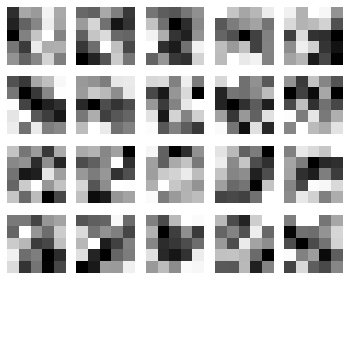

In [28]:
def plot_conv_weights(layer, figsize=(6, 6)):
    """plot the weights of a specific layer"""

    W =  np.squeeze(layer.W.get_value())
    shape = W.shape
    nrows = np.ceil(np.sqrt(shape[0])).astype(int)
    ncols = nrows

    # setup axes
    figs, axes = plt.subplots(nrows, ncols, figsize=figsize,frameon=False)
    for ax in axes.flatten():
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis('off')

    # plot weights
    for i, ax in enumerate(axes.ravel()):
        if i >= shape[0]:
            break
        im = ax.imshow(W[i], cmap='gray', interpolation='nearest')

    return figs, axes

figs, axes = plot_conv_weights(l_conv1)
plt.savefig('MNIST_conv1_filters.eps', format='eps', dpi=1000)

The filters look fine.  I don't see too many redundant features, which would indicate overfitting. So let's move on for now. Now let's get the feature maps of the first convolutional layer. 

In [29]:
def get_feature_maps(layer, X, batch_size=500):
    """get the feature maps of a given convolutional layer"""

    # setup theano function to get feature map of a given layer
    num_data = len(X)
    feature_maps = theano.function([input_var], layers.get_output(layer), allow_input_downcast=True)
    map_shape = get_output_shape(layer)

    # get feature maps in batches for speed (large batches may be too much memory for GPU)
    num_batches = num_data // batch_size
    shape = list(map_shape)
    shape[0] = num_data
    fmaps = np.empty(tuple(shape))
    for i in range(num_batches):
        index = range(i*batch_size, (i+1)*batch_size)    
        fmaps[index] = feature_maps(X[index])

    # get the rest of the feature maps
    excess = num_data-num_batches*batch_size
    index = range(num_data-excess, num_data)    
    fmaps[index] = feature_maps(X[index])
    
    return fmaps

fmaps = get_feature_maps(l_pool1, X_train, batch_size=512)
fmaps_flat = fmaps.reshape((len(fmaps),-1))

Now perform tSNE using the Barnes-Hut approximation (grab a beer, this may take about 20 minutes).

In [30]:
# perform t-SNE embedding
vis_cnn = bh_sne(fmaps_flat.astype(float))

Let's first visualize with datapoints on the 2D projection surface with colors given by their respective labels

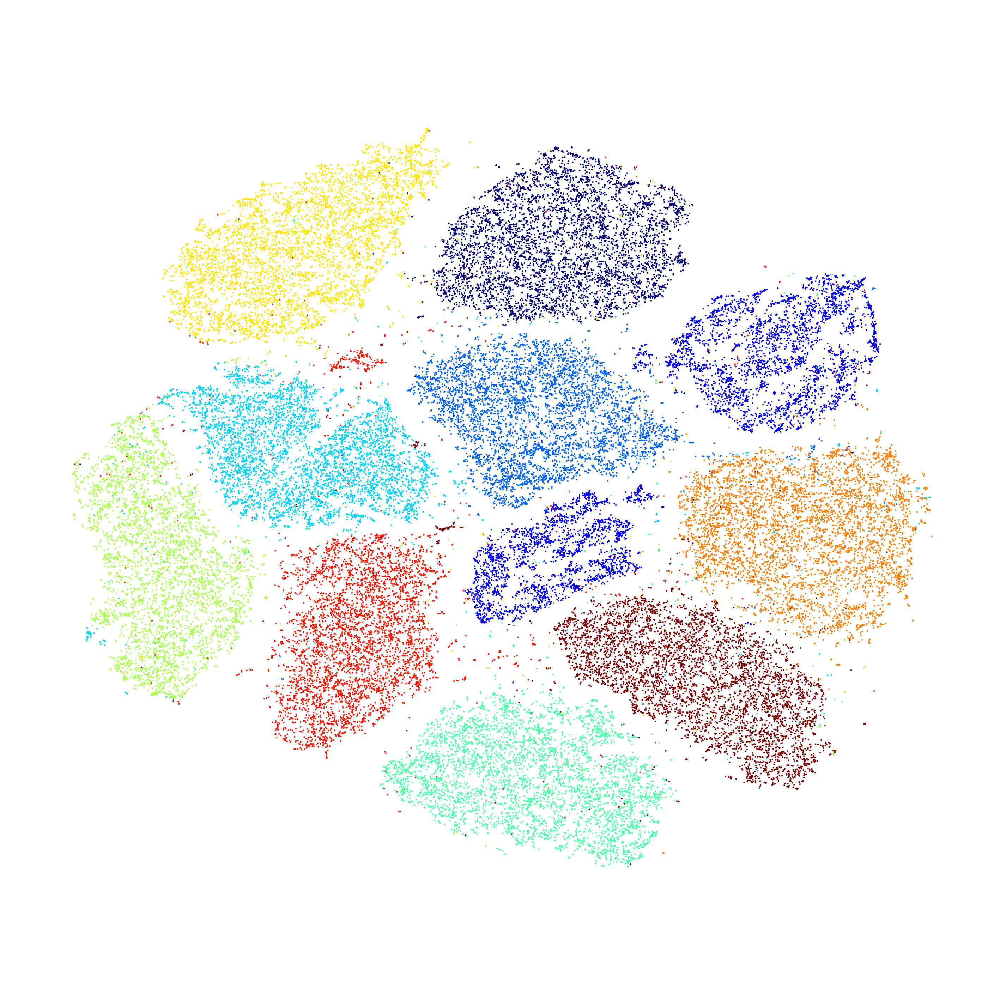

In [31]:
# plot the result
plt = tSNE_plot(vis_cnn, y_train)    
plt.savefig('MNIST_tSNE_conv1.eps', format='eps', dpi=1000)

Next, let's embed the acutal images onto each projection coordinate to see if we can notice anything neat about the structure of the data.

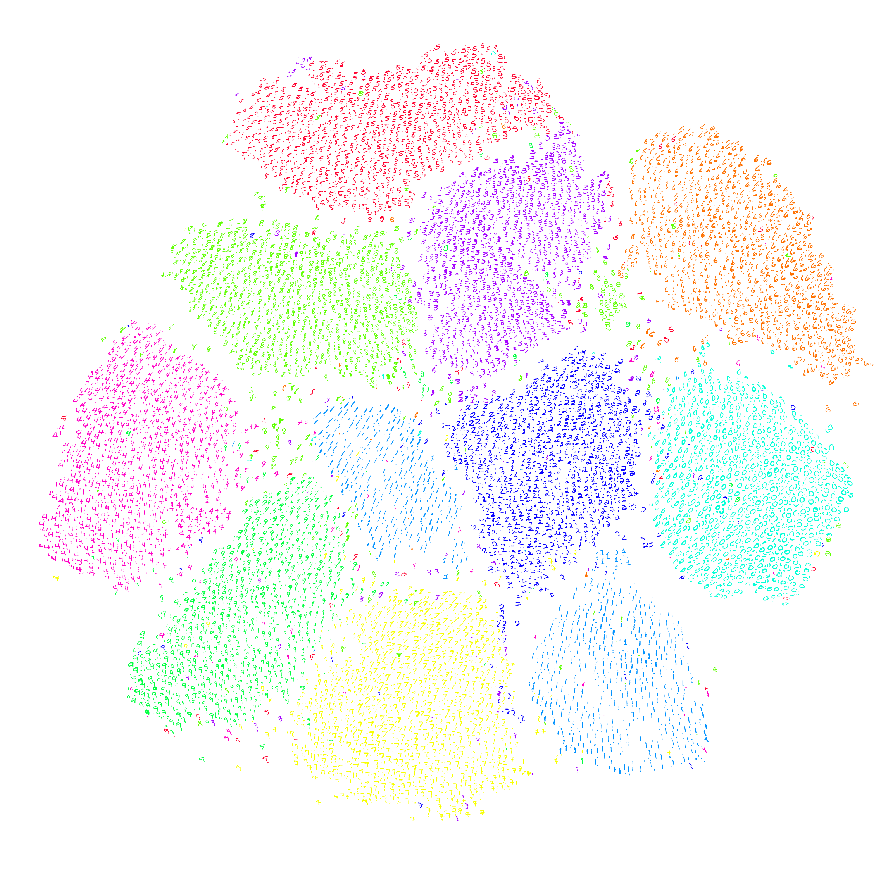

In [32]:
plt = tSNE_embed_plot(vis_cnn, X_train, y_train)
plt.savefig('MNIST_tSNE_conv1_embed.eps', format='eps', dpi=1000)

### Convolution layer 2

Now, let's look at the feature maps of the second convolutional layer, which are the final features right before the dense network, which can be thought of as our classifier. What is the structure of the representations that our simple CNN has learned?  

In [33]:
fmaps = get_feature_maps(l_pool2, X_train, batch_size=512)
fmaps_flat = fmaps.reshape((len(fmaps),-1))
fmaps_flat.shape

# perform t-SNE embedding
vis_cnn2 = bh_sne(fmaps_flat.astype(float))

Let's visualize the tSNE projections

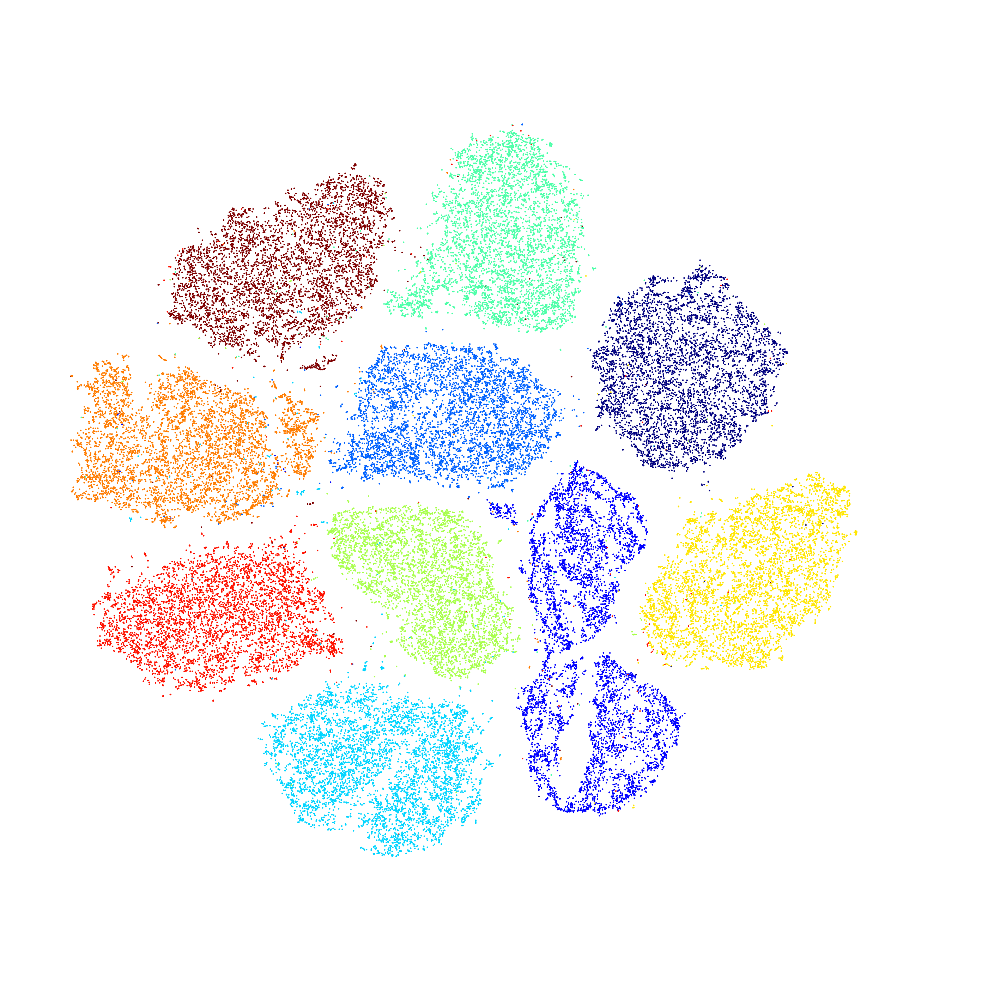

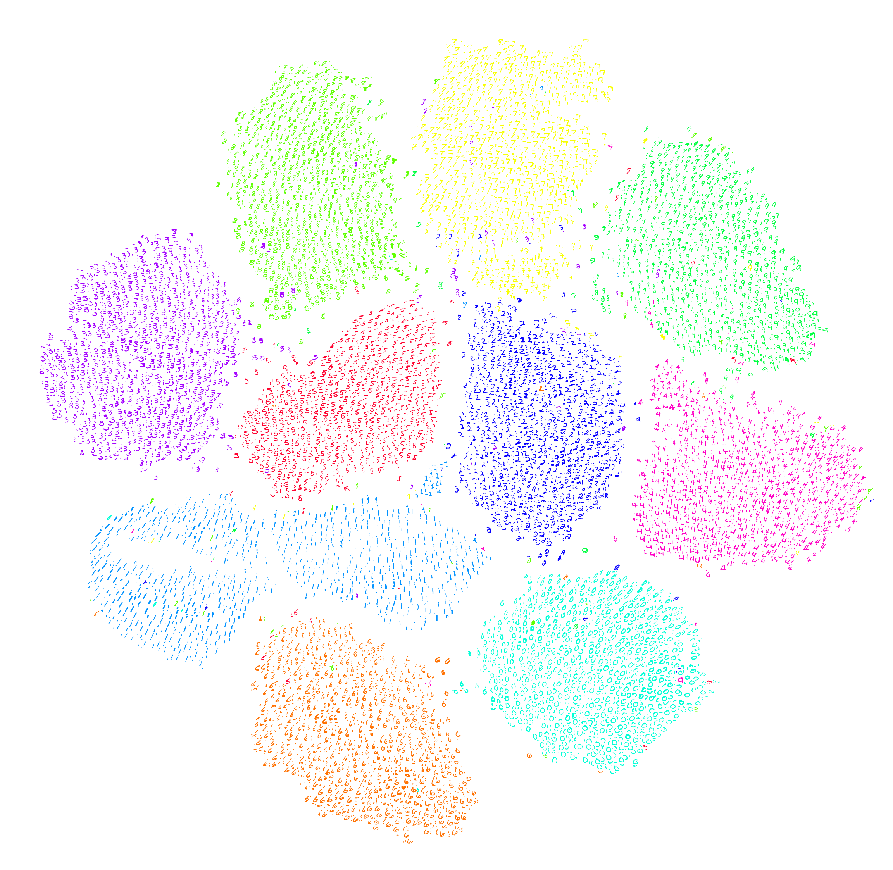

In [34]:
plt = tSNE_plot(vis_cnn2, y_train)    
plt.savefig('MNIST_tSNE_conv2.eps', format='eps', dpi=1000)

plt = tSNE_embed_plot(vis_cnn2, X_train, y_train)
plt.savefig('MNIST_tSNE_conv2_embed.eps', format='eps', dpi=1000)

### Dense layer 3

Now let's look at the output from the dense layer to see what are the final features right before the softmax classifier.

In [36]:
fmaps = get_feature_maps(l_nonlin3, X_train, batch_size=512)
fmaps_flat = fmaps.reshape((len(fmaps),-1))

# perform t-SNE
vis_dense3 = bh_sne(fmaps_flat.astype(float))

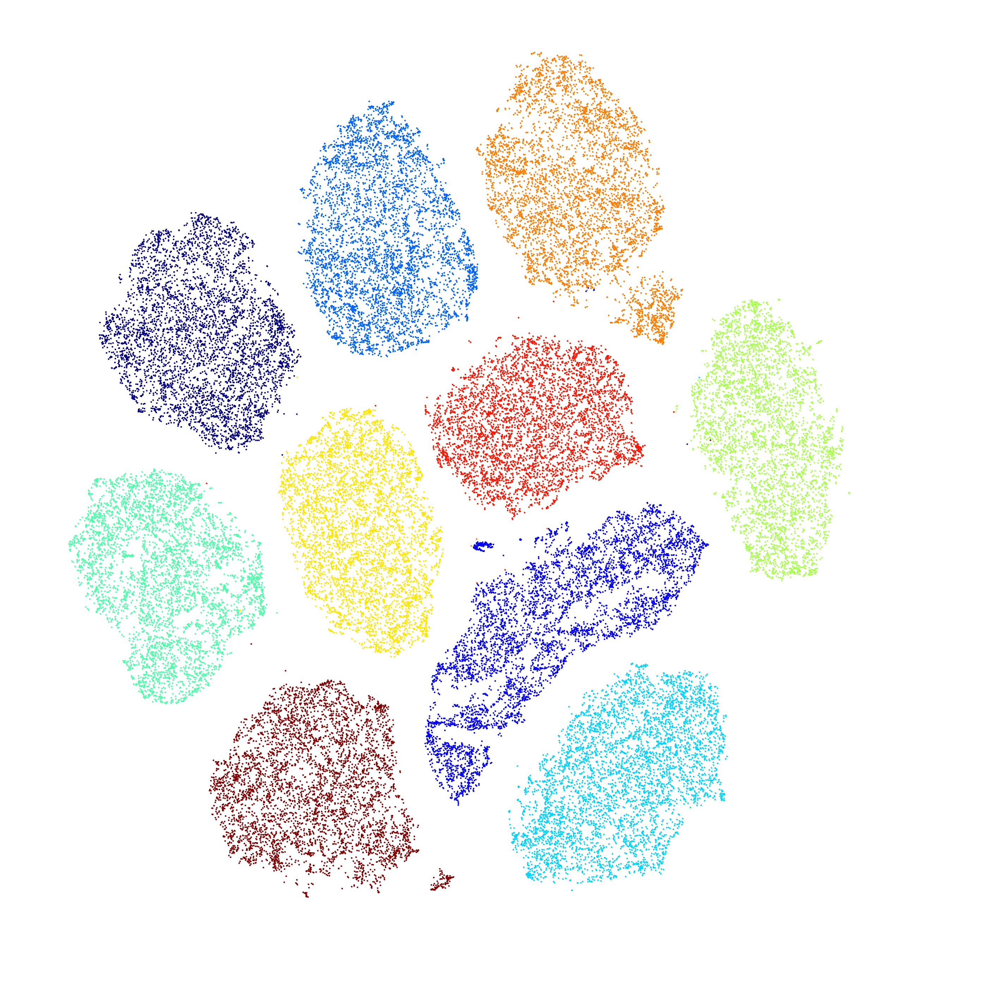

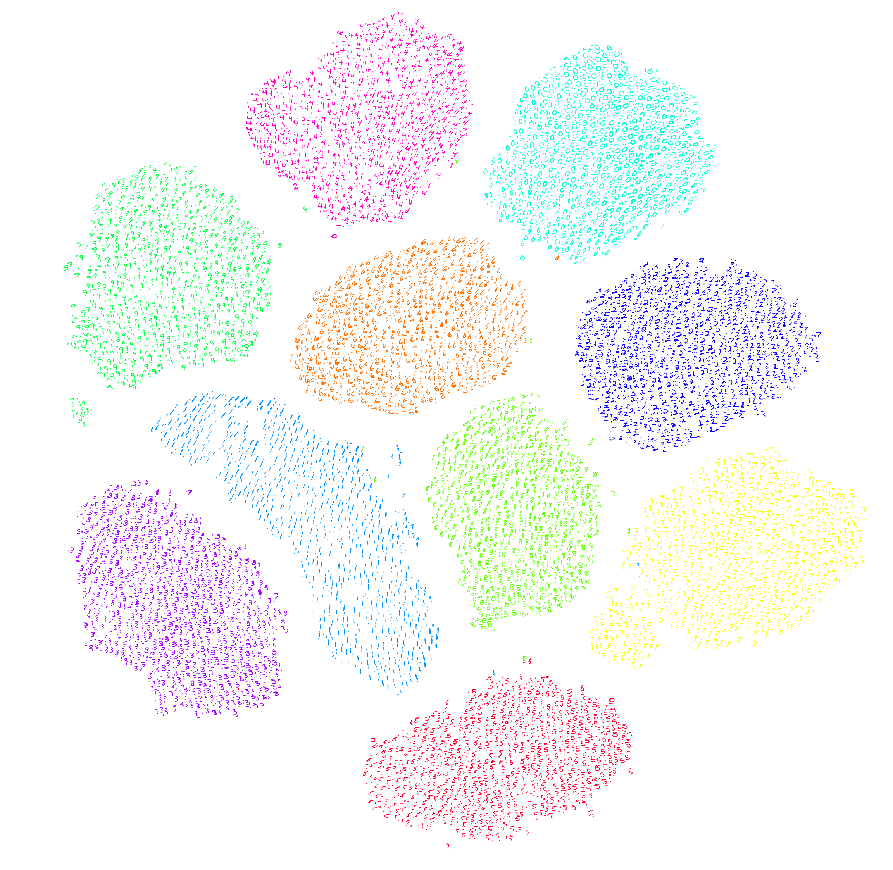

In [37]:
plt = tSNE_plot(vis_dense3, y_train)    
plt.savefig('MNIST_tSNE_dense3.eps', format='eps', dpi=1000)

plt = tSNE_embed_plot(vis_dense3, X_train, y_train)
plt.savefig('MNIST_tSNE_dense3_embed.eps', format='eps', dpi=1000)

The reconstruction tSNE projection plot looks a little cleaner than the raw pixel projections. 

## Conclusions

tSNE is a good tool to help understand the internal structure of the data. The structure can be explored through visuals like the embeded images, where we plotted the original data but on the projection coordinates. 

As an example, we explored the MNIST dataset.  Evidently, the MNIST dataset is extremely easy to classify. This is illustrated by the clear separability of the classes after tSNE dimensionality reduction, even when analyzing the raw image pixels. This means, you can probably use a simple non-linear classifier or a kernal-based classifier to map out the decision boundaries of each class. 

This tutorial shows that tSNE can be used as a tool to see whether the neural network model is learning useful things by seeing if the classes are become more seperable. Thus, we can employ tSNE as a complimentary analysis with validation performance to understand deep learning architectures to see what works and what doesn't.    



